# Find Night Sky Emission Lines for APF Data

In [33]:
import os
import numpy as np
import matplotlib.pylab as plt
from astropy.io import fits
import pandas as pd
from scipy.interpolate import splev, splrep

plt.rcParams["figure.figsize"] = (18,6)
plt.rcParams.update({'font.size': 20})

In [34]:
directory = '/datag/blpd0/datax/apf'

In [35]:
# # every file in data center that starts with "r"
# list_of_files = []
# for filename in os.listdir(directory):
#     if filename.endswith(".fits") and filename.startswith("r"): 
#         file_path = os.path.join(directory, filename)
#         list_of_files = np.append(list_of_files, file_path)

In [36]:
# exposure_times = []
# for file in list_of_files:
#     file = fits.open(file)
#     header = file[0].header
#     exposure_time = header['EXPTIME']
#     exposure_times = np.append(exposure_times, exposure_time)

In [37]:
# df = pd.DataFrame({'directory': list_of_files, 'exptime': exposure_times})
# df.to_pickle("/mnt_home/zoek/code/APF-BL-DAP/Zoe/SkyEmissionLines/exptimes.pkl")

In [38]:
df = pd.read_pickle("/mnt_home/zoek/code/APF-BL-DAP/Zoe/SkyEmissionLines/exptimes.pkl")
df_sorted = df.sort_values('exptime', ascending=False, inplace=False)

In [39]:
fnames = df['directory'].tolist()
# list of file names
fnames_sorted = df_sorted['directory'].tolist()
# list of file names sorted by exposure times (highest to lowest)

In [40]:
df_sorted

,directory,exptime
684,/datag/blpd0/datax/apf/raxn.244.fits,1800.00
3297,/datag/blpd0/datax/apf/rasg.200.fits,1800.00
3322,/datag/blpd0/datax/apf/rasq.206.fits,1800.00
3343,/datag/blpd0/datax/apf/ratc.196.fits,1800.00
180,/datag/blpd0/datax/apf/raqn.223.fits,1800.00
...,...,...
2934,/datag/blpd0/datax/apf/rzej.127.fits,1.90
2940,/datag/blpd0/datax/apf/rzem.124.fits,1.81
5838,/datag/blpd0/datax/apf/rzev.768.fits,1.77
794,/datag/blpd0/datax/apf/razc.219.fits,1.67


In [41]:
APF_wavelength_path = '/mnt_home/zoek/code/APF-BL-DAP/Zoe/APFTutorial/apf_wav.fits'
wl_file = fits.open(APF_wavelength_path)
wl_image = wl_file[0].data

#### Plot the emission line due to the creation of ozone for the spectra with longest exposure times

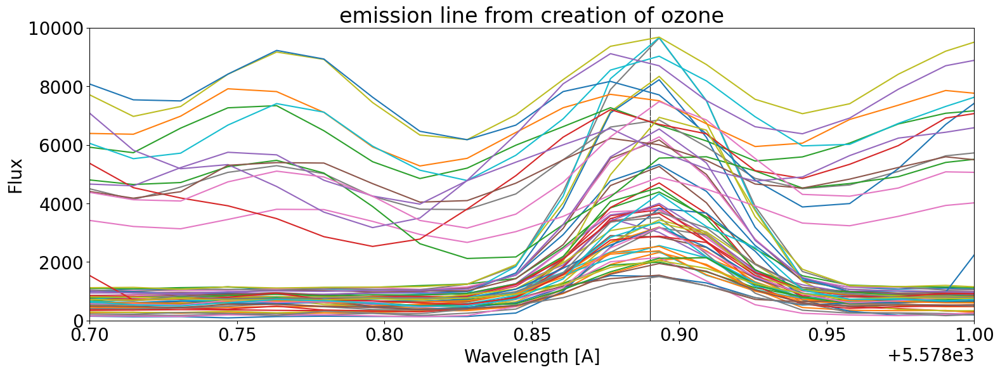

In [42]:
wls = []

for f in fnames_sorted[:60]:
    
    APF_flux_path = f
    fl_file = fits.open(APF_flux_path)

    fl_image = fl_file[0].data
    header = fl_file[0].header
    star = header['OBJECT']
#     print('Star: ' + star)

    order = 40
    wl = wl_image[order]
    flux = fl_image[order][:-1]
    plt.plot(wl,flux)
    
    plt.vlines(5578.89, ymin=-100, ymax=100000, linestyle='--', linewidth = 0.5, label='sky emission line')

    plt.xlim(5578.7, 5579)
    plt.ylim(0, 10000)
    
    
    
    mask = (wl > 5578.85) & (wl < 5578.95)
    new_wl = wl[mask]
    new_fl = flux[mask]
    
    max_fl = max(new_fl)
    max_index = new_fl.tolist().index(max_fl)
    emission_line_wl = new_wl[max_index]
    wls += [emission_line_wl]

    plt.title('emission line from creation of ozone')
    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
plt.show()

At bluest region (order 1) @4000A:
    1 pixel = 0.0163 A
Middle (order 31) @5000A:
    1 pixel = 0.0195 A
At reddest region (order 79) @10,000A:
    1 pixel = 0.0254 A

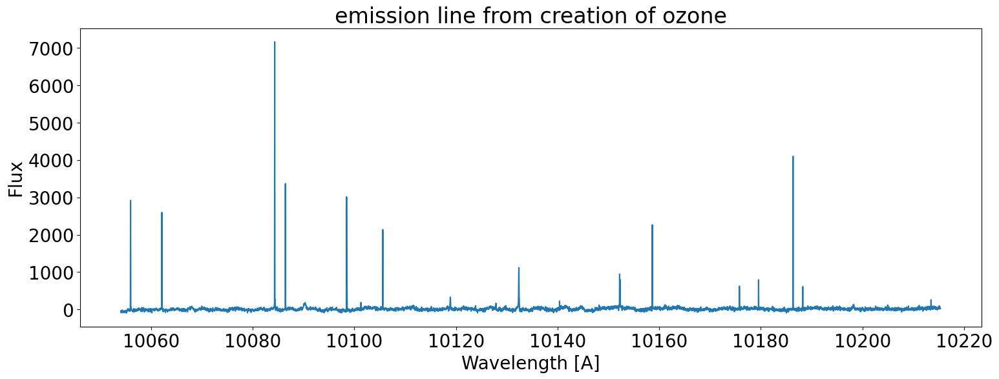

0.04492640416174254

In [43]:
APF_flux_path = fnames_sorted[0]
fl_file = fits.open(APF_flux_path)

fl_image = fl_file[0].data
header = fl_file[0].header
star = header['OBJECT']

order = 78
wl = wl_image[order]
flux = fl_image[order][:-1]
plt.plot(wl,flux)

plt.title('emission line from creation of ozone')
plt.xlabel('Wavelength [A]')
plt.ylabel('Flux')
plt.show()

wl[5] - wl[4]

#### Plot the emission line due to the creation of ozone for the spectra with longest exposure times and stack the spectra

In [44]:
print(max(wls) - 5578.89)
print(5578.89 - min(wls))

0.019170370549545623
0.013383246699959273


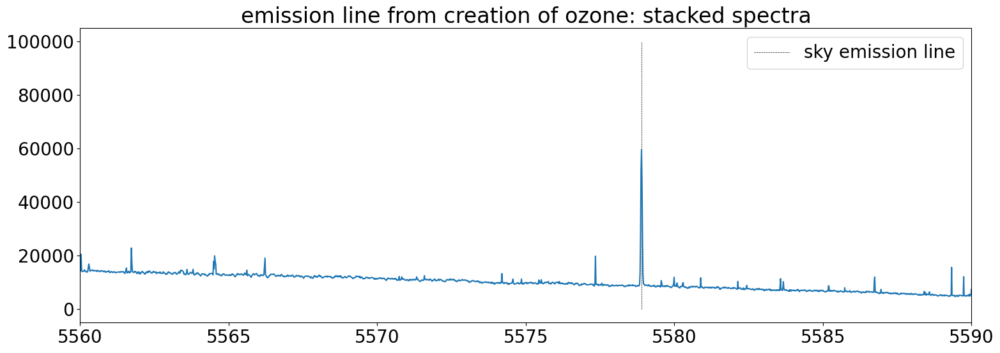

In [45]:
order = 40
wl = wl_image[order]

APF_flux_path = fnames_sorted[0]
fl_file = fits.open(APF_flux_path)
fl_image = fl_file[0].data
flux_vals = np.array(fl_image[order][:-1])


for f in fnames_sorted[1:10]:
    APF_flux_path = f
    fl_file = fits.open(APF_flux_path)
    fl_image = fl_file[0].data

    flux = fl_image[order][:-1]
    flux_vals += np.array(flux)

plt.plot(wl, flux_vals)
plt.xlim(5560, 5590)
plt.vlines(5578.89, ymin=-100, ymax=100000, linestyle='--', linewidth = 0.5, label='sky emission line')
plt.legend()
plt.title('emission line from creation of ozone: stacked spectra')
plt.show()

#### Explore different region of stars with longest exposure times

Star: KIC8462852t
Star: KIC8462852
Star: KIC8462852t
Star: KIC8462852t
Star: KIC8462852
Star: KIC8462852t
Star: KIC8462852t
Star: KIC8462852t
Star: KIC8462852t
Star: KIC8462852t


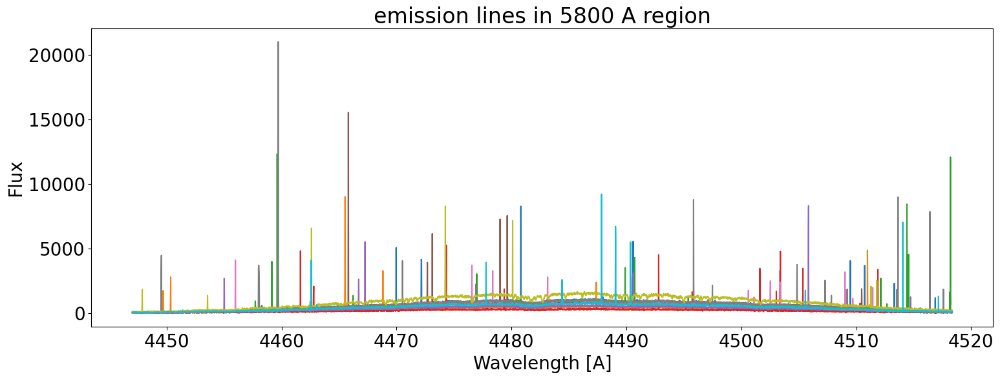

In [12]:
for f in fnames_sorted[:10]:
    order = 20
    
    APF_flux_path = f
    fl_file = fits.open(APF_flux_path)

    fl_image = fl_file[0].data
    header = fl_file[0].header
    star = header['OBJECT']
    print('Star: ' + star)

    wl = wl_image[order]
    flux = fl_image[order][:-1]
    plt.plot(wl,flux)
#     plt.xlim( 5795, 5805)
#     plt.ylim(0, 10000)

    plt.title('emission lines in 5800 A region')
    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
plt.show()

#### Explore emission line due to creation of ozone for random list of stars (ignoring exposure times) - observation: we don't see this emission lines for other spectra

Star: HIP113357
Star: HIP95853
Star: HIP12444
Star: HIP60965
Star: HIP12444
Star: HIP64241
Star: HIP42172
Star: HIP65477
Star: HIP56445
Star: HIP69483


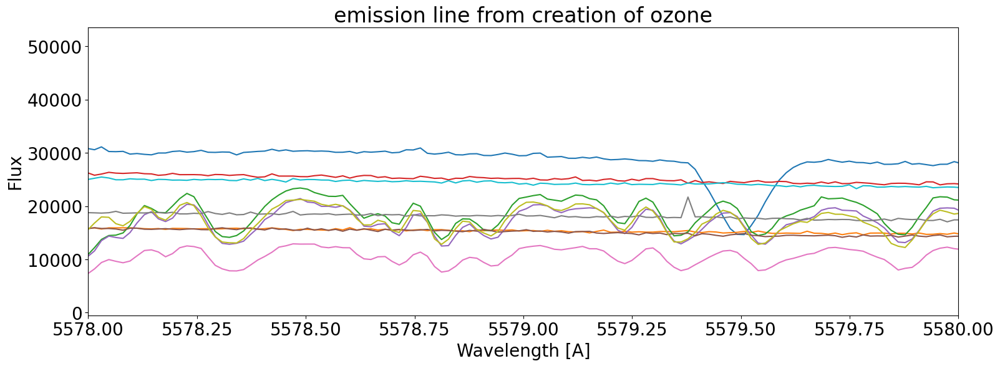

In [13]:
for f in fnames[0:10]:
    
    APF_flux_path = f
    fl_file = fits.open(APF_flux_path)

    fl_image = fl_file[0].data
    header = fl_file[0].header
    
    star = header['OBJECT']
    print('Star: ' + star)

    order = 40
    wl = wl_image[order]
    flux = fl_image[order][:-1]
    plt.plot(wl,flux)
    plt.xlim(5578, 5580)

    plt.title('emission line from creation of ozone')
    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
plt.show()

# Use KIC 8462852 (Tabby's Star) to create emission line atlas

In [14]:
# save numpy array of all files corresponding to KIC

# kic_fnames = []

# for f in fnames:
#     APF_flux_path = f
#     fl_file = fits.open(APF_flux_path)
#     header = fl_file[0].header
#     star = header['OBJECT']
#     if (star == 'KIC8462852t') or (star == 'KIC8462852'):
#         kic_fnames = np.append(kic_fnames, f)
#     else:
#         continue

# np.save('/mnt_home/zoek/code/APF-BL-DAP/Zoe/SkyEmissionLines/kick_fnames.npy', kic_fnames)

In [15]:
kic_fnames = np.load('/mnt_home/zoek/code/APF-BL-DAP/Zoe/SkyEmissionLines/kic_fnames.npy')

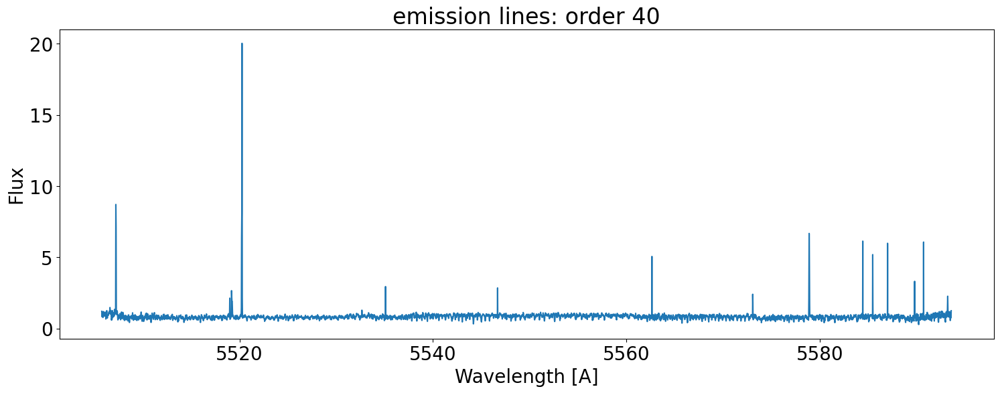

In [16]:
# plot each spectrum individually 

for f in kic_fnames[1:2]:
    
    order = 40
    
    APF_flux_path = f
    fl_file = fits.open(APF_flux_path)
    fl_image = fl_file[0].data
    header = fl_file[0].header

    wl = wl_image[order]
    flux = fl_image[order][:-1]
    
    
    bin = 100

    # this list will contain the indices corresponding to each of the 95th percentile flux values in each bin
    indices = []

    for i in np.arange((len(wl) - (bin)), step = bin):
        flux_values = []
        for j in np.arange(i, i + bin, step = 1):
            value = flux[j]
            flux_values = np.append(flux_values, value)
        # find the 95th percentile flux value: we use 95 to get the maximum flux value in general 
        # but avoid issues with cosmic rays and other emission lines
        flux_in_bin = np.percentile(flux_values, 95)
        # find the closest value in the flux array to the 95th percentile value
        absolute_difference_function = lambda list_value : abs(list_value - flux_in_bin)
        flux_in_bin = min(flux_values.tolist(), key=absolute_difference_function)
        index_in_bin = flux_values.tolist().index(flux_in_bin)
        index = i + index_in_bin
        indices = np.append(indices, index)

    # these lists will contain the wavlength and flux values at each index in 'indices'
    wl_values = []
    fl_values = []

    for index in indices:
        ind = int(index)
        wl_values = np.append(wl_values, wl[ind])
        fl_values = np.append(fl_values, flux[ind])

    spl = splrep(wl_values, fl_values, s = 500000)
    flux_fit = splev(wl, spl)
    
    first_normalized_flux = flux / flux_fit
    plt.plot(wl, first_normalized_flux)
    plt.title('emission lines: order ' + str(order))
    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
#     plt.xlim(5578, 5585)
plt.show()

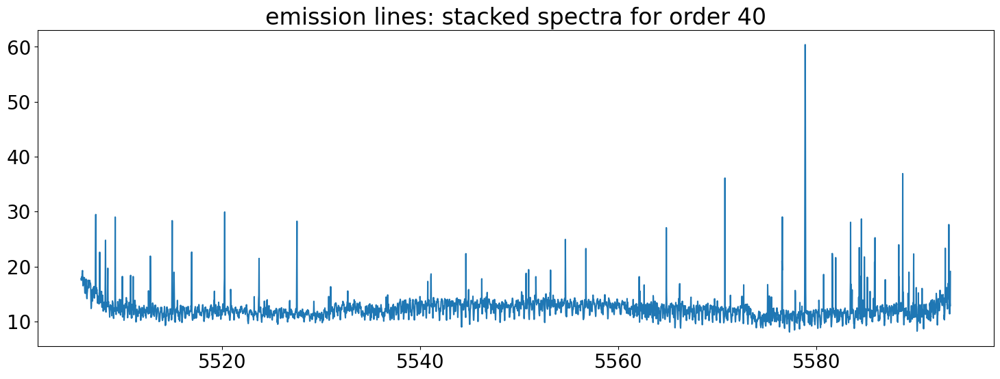

In [17]:
# add up spectra

for order in np.arange(40, 41):
    wl = wl_image[order]
    flux_vals = []

    # APF_flux_path = kic_fnames[0]
    # fl_file = fits.open(APF_flux_path)
    # fl_image = fl_file[0].data
    # flux_vals = np.array(fl_image[order][:-1])


    for f in kic_fnames[1:15]:
        APF_flux_path = f
        fl_file = fits.open(APF_flux_path)
        fl_image = fl_file[0].data

        flux = fl_image[order][:-1]

        bin = 100

        # this list will contain the indices corresponding to each of the 95th percentile flux values in each bin
        indices = []

        for i in np.arange((len(wl) - (bin)), step = bin):
            flux_values = []
            for j in np.arange(i, i + bin, step = 1):
                value = flux[j]
                flux_values = np.append(flux_values, value)
            # find the 95th percentile flux value: we use 95 to get the maximum flux value in general 
            # but avoid issues with cosmic rays and other emission lines
            flux_in_bin = np.percentile(flux_values, 95)
            # find the closest value in the flux array to the 95th percentile value
            absolute_difference_function = lambda list_value : abs(list_value - flux_in_bin)
            flux_in_bin = min(flux_values.tolist(), key=absolute_difference_function)
            index_in_bin = flux_values.tolist().index(flux_in_bin)
            index = i + index_in_bin
            indices = np.append(indices, index)

        # these lists will contain the wavlength and flux values at each index in 'indices'
        wl_values = []
        fl_values = []

        for index in indices:
            ind = int(index)
            wl_values = np.append(wl_values, wl[ind])
            fl_values = np.append(fl_values, flux[ind])

        spl = splrep(wl_values, fl_values, s = 500000)
        flux_fit = splev(wl, spl)

        first_normalized_flux = flux / flux_fit
        
        # ONLY ACCEPT FLUX VALUES IF THERE ARE NO EMISSION LINES SURPASSING
        # 50 IN FLUX
        if (sum(first_normalized_flux > 50) == 0) and (sum(first_normalized_flux < -50) == 0):
            if np.array_equal(flux_vals,np.array([])):
                flux_vals = np.array(first_normalized_flux)
            else:
                flux_vals += np.array(first_normalized_flux)

    plt.plot(wl, flux_vals)
#     plt.ylim(0, 220)
    # plt.xlim(5578, 5580)
    # plt.vlines(5578.89, ymin=0, ymax=50, linestyle='--', linewidth = 0.5, label='sky emission line')
    # plt.legend()
    plt.title('emission lines: stacked spectra for order ' + str(order))
    plt.show()

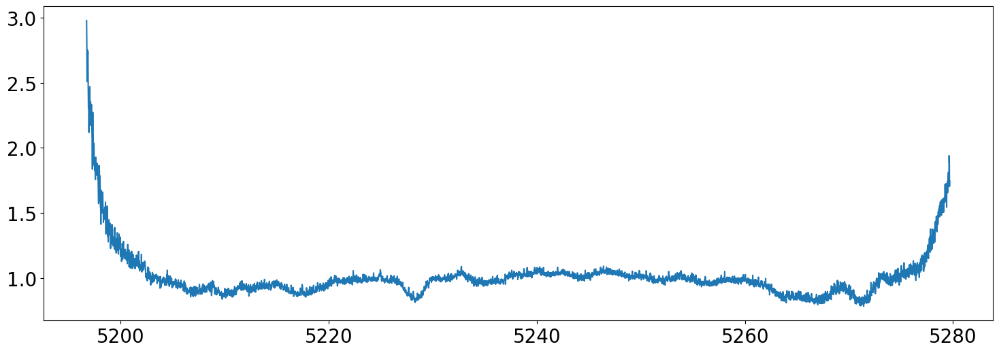

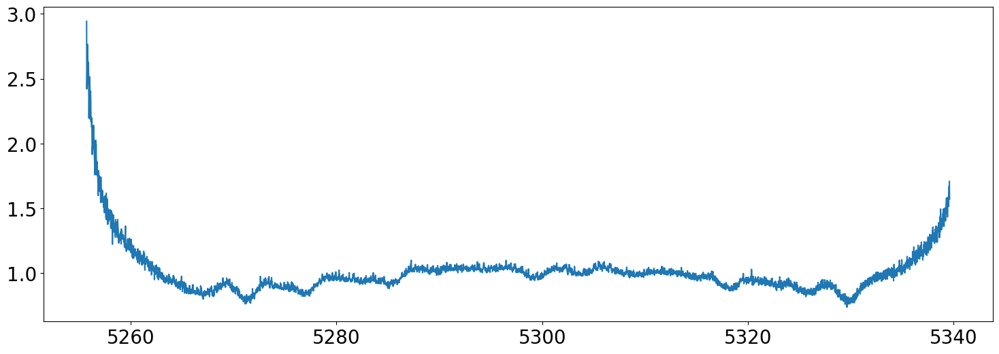

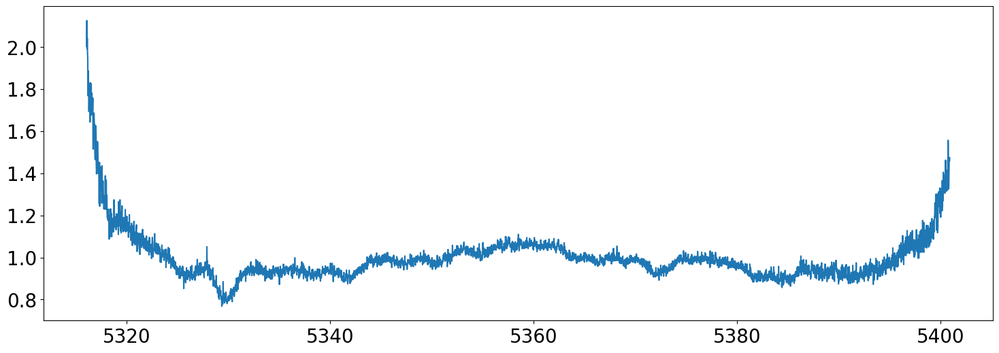

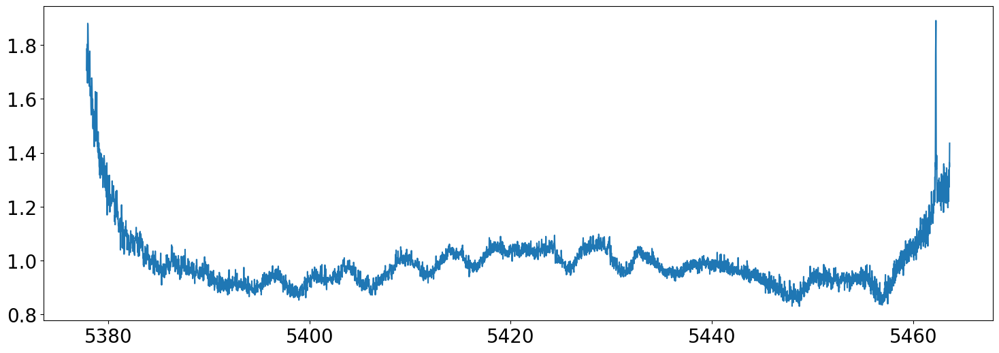

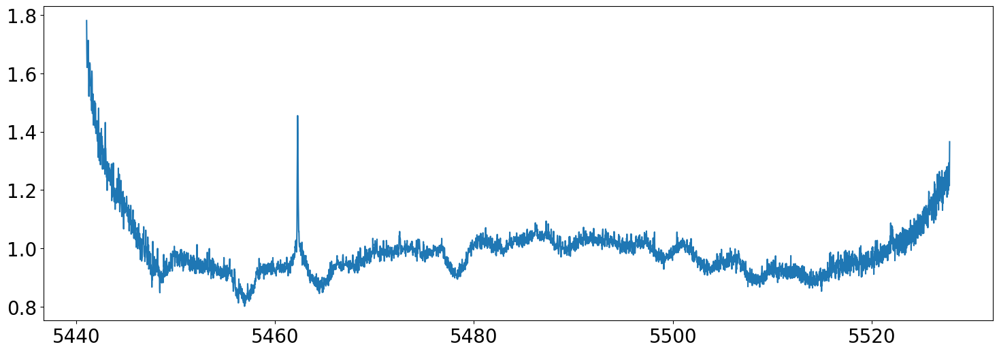

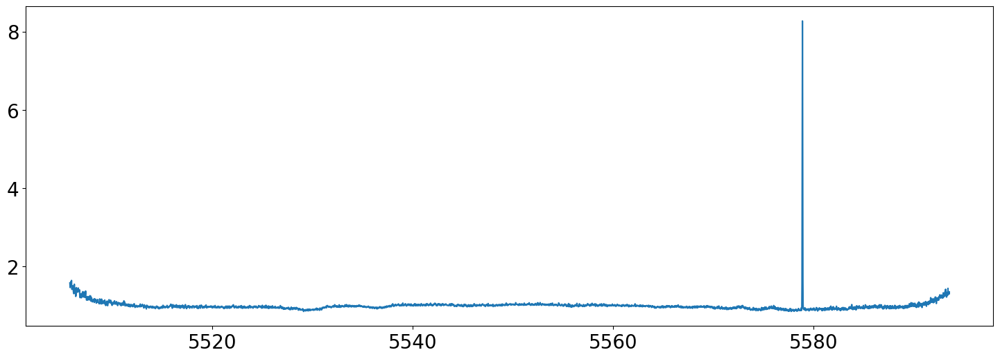

In [18]:
# take certain percentile of spectra

percentile = 90

for order in np.arange(35, 41):
    wl = wl_image[order]
    flux_vals = []

    # APF_flux_path = kic_fnames[0]
    # fl_file = fits.open(APF_flux_path)
    # fl_image = fl_file[0].data
    # flux_vals = np.array(fl_image[order][:-1])


    for f in kic_fnames[1:60]:
        APF_flux_path = f
        fl_file = fits.open(APF_flux_path)
        fl_image = fl_file[0].data

        flux = fl_image[order][:-1]

        bin = 100

        # this list will contain the indices corresponding to each of the 95th percentile flux values in each bin
        indices = []

        for i in np.arange((len(wl) - (bin)), step = bin):
            flux_values = []
            for j in np.arange(i, i + bin, step = 1):
                value = flux[j]
                flux_values = np.append(flux_values, value)
            # find the 95th percentile flux value: we use 95 to get the maximum flux value in general 
            # but avoid issues with cosmic rays and other emission lines
            flux_in_bin = np.percentile(flux_values, 95)
            # find the closest value in the flux array to the 95th percentile value
            absolute_difference_function = lambda list_value : abs(list_value - flux_in_bin)
            flux_in_bin = min(flux_values.tolist(), key=absolute_difference_function)
            index_in_bin = flux_values.tolist().index(flux_in_bin)
            index = i + index_in_bin
            indices = np.append(indices, index)

        # these lists will contain the wavlength and flux values at each index in 'indices'
        wl_values = []
        fl_values = []

        for index in indices:
            ind = int(index)
            wl_values = np.append(wl_values, wl[ind])
            fl_values = np.append(fl_values, flux[ind])

        spl = splrep(wl_values, fl_values, s = 500000)
        flux_fit = splev(wl, spl)

        first_normalized_flux = flux / flux_fit
        
        
        if np.array_equal(flux_vals,np.array([])):
            flux_vals = [first_normalized_flux]
        else:
            flux_vals += [first_normalized_flux]    
        median_flux_array = np.percentile(np.stack(flux_vals), percentile, axis = 0)

    plt.plot(wl, median_flux_array)

#     plt.ylim(0, 220)
    # plt.xlim(5578, 5580)
    # plt.vlines(5578.89, ymin=0, ymax=50, linestyle='--', linewidth = 0.5, label='sky emission line')
    # plt.legend()
#     plt.title('emission lines: stacked spectra for order ' + str(order))
    plt.show()

# Overplot known emission lines from Mount Hamilton

In [19]:
folder = '/mnt_home/zoek/code/APF-BL-DAP/Zoe/SkyEmissionLines/HamiltonLines/'

In [20]:
fnames = ['OH.pkl',
 'HG.pkl',
 'NA.pkl',
 'NE.pkl',
 'SC.pkl',
 'SE.pkl',
 'TH.pkl',
 'TH2.pkl',
 'add.pkl',
 'unidentified.pkl']

In [21]:
table = pd.read_pickle(folder + 'AllLines.pkl').sort_values('LickLambda')
all_lines = table['LickLambda'].to_numpy().astype(float)

In [22]:
table[[]]

""
209
210
34
81
35
...
206
207
49
50


In [23]:
all_lines_df = pd.concat([pd.read_pickle(folder + fnames[i]) for i in np.arange(1, 7)])

In [24]:
strongest_lines = all_lines_df.sort_values('RI', ascending=False)['LickLambda'].to_numpy().astype(float)[0:50]
strongest_lines.sort()
strongest_lines

array([4046.54 , 4077.842, 4246.821, 4320.736, 4325.002, 4358.316,
       4374.427, 4415.555, 4728.79 , 4729.239, 4734.134, 4737.673,
       4741.055, 4743.847, 4753.167, 4982.8  , 5064.346, 5089.924,
       5096.747, 5099.246, 5101.139, 5349.319, 5349.719, 5356.118,
       5375.394, 5460.734, 5482.039, 5671.832, 5682.627, 5686.852,
       5688.196, 5700.177, 5708.632, 5711.777, 5717.319, 5724.115,
       5769.579, 5790.643, 5889.941, 5895.917, 6074.324, 6143.058,
       6154.241, 6160.757, 6210.674, 6258.991, 6402.245, 7032.414,
       8183.267, 8194.81 ])

In [25]:
# find all the orders that contain strong sky emission lines
orders_with_strong_lines = []

for order in np.arange(79):
    wl = wl_image[order]
    boolean_array = np.logical_and(strongest_lines >= min(wl), strongest_lines <= max(wl))
    in_range_indices = np.where(boolean_array)[0]
    if in_range_indices.size != 0:
        orders_with_strong_lines += [order]

In [26]:
orders_with_strong_lines

[8,
 9,
 10,
 14,
 15,
 16,
 17,
 18,
 19,
 25,
 26,
 30,
 31,
 32,
 33,
 37,
 38,
 39,
 42,
 43,
 44,
 45,
 47,
 48,
 49,
 50,
 51,
 58,
 67]

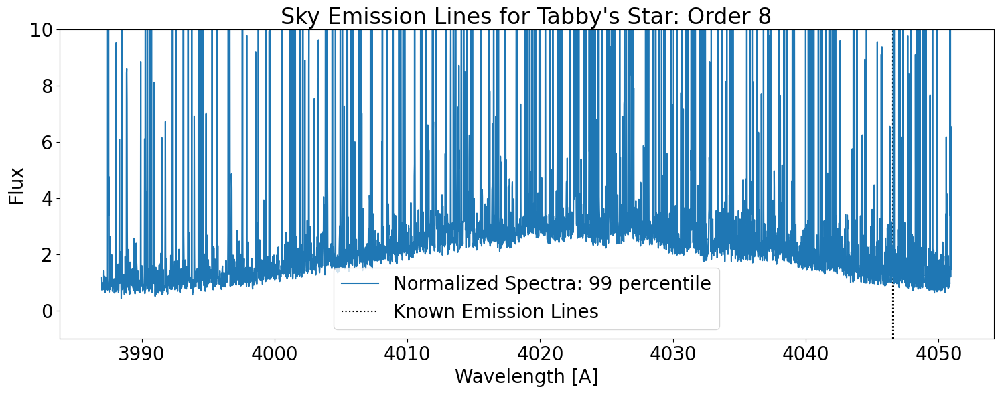

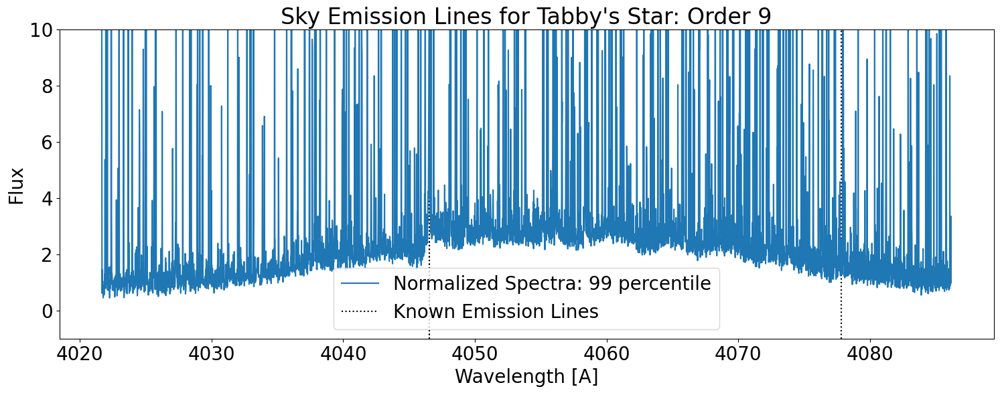

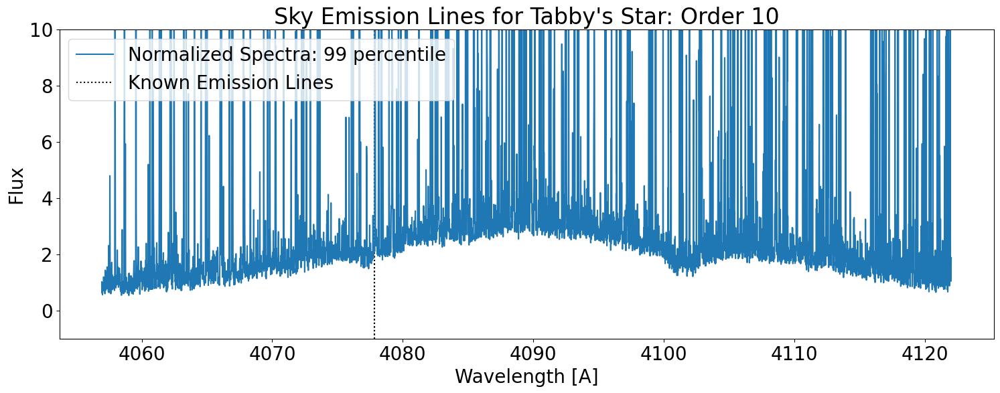

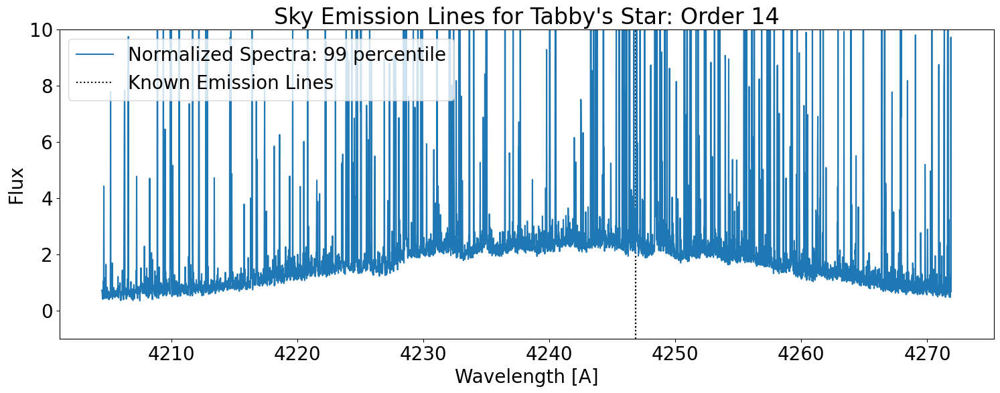

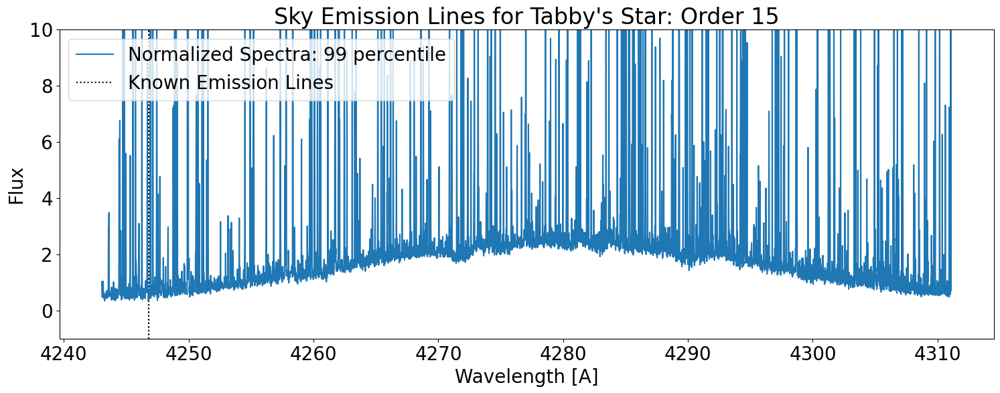

...

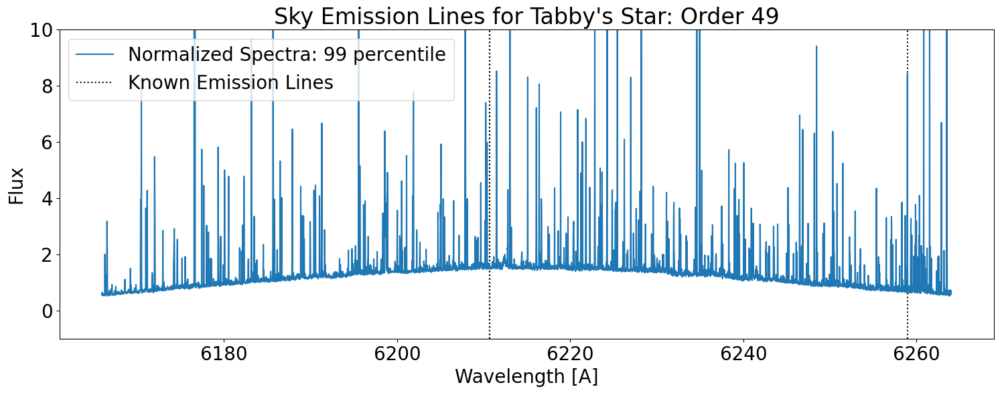

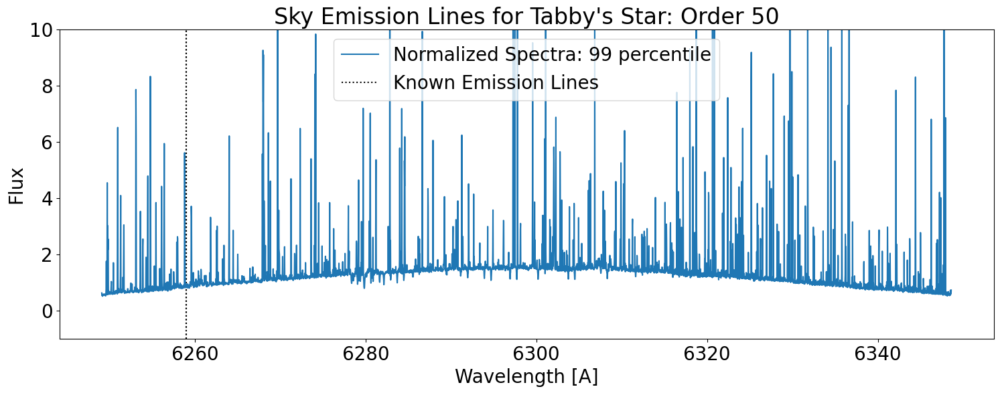

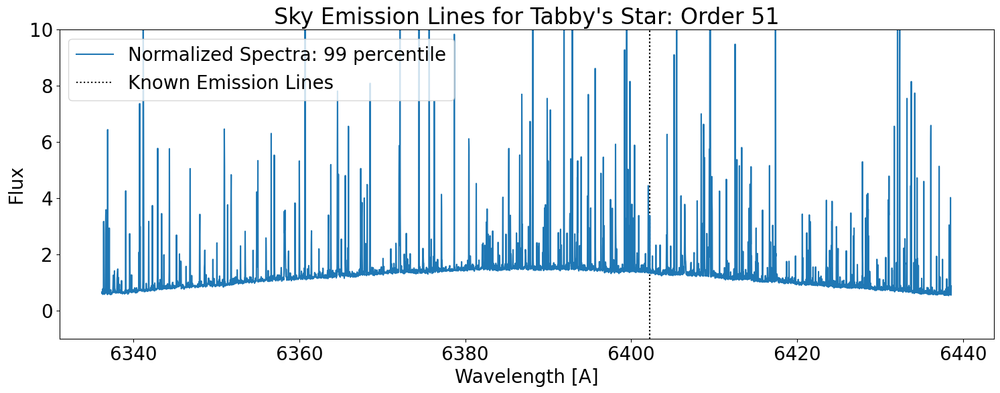

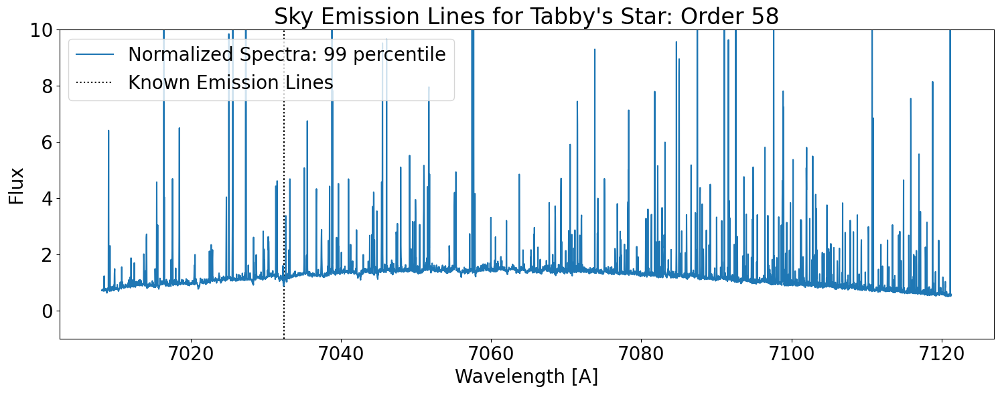

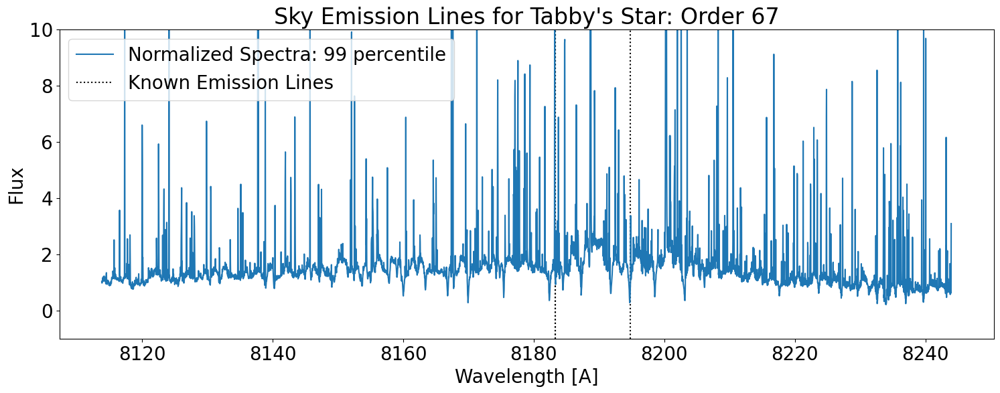

In [27]:
# take certain percentile of spectra

percentile = 99

deblaze = False

for order in orders_with_strong_lines:
    wl = wl_image[order]
    flux_vals = []

    for f in kic_fnames[1:60]:
        APF_flux_path = f
        fl_file = fits.open(APF_flux_path)
        fl_image = fl_file[0].data

        flux = fl_image[order][:-1]
        
        if deblaze == True:

            bin = 100

            # this list will contain the indices corresponding to each of the 95th percentile flux values in each bin
            indices = []

            for i in np.arange((len(wl) - (bin)), step = bin):
                flux_values = []
                for j in np.arange(i, i + bin, step = 1):
                    value = flux[j]
                    flux_values = np.append(flux_values, value)
                # find the 95th percentile flux value: we use 95 to get the maximum flux value in general 
                # but avoid issues with cosmic rays and other emission lines
                flux_in_bin = np.percentile(flux_values, 95)
                # find the closest value in the flux array to the 95th percentile value
                absolute_difference_function = lambda list_value : abs(list_value - flux_in_bin)
                flux_in_bin = min(flux_values.tolist(), key=absolute_difference_function)
                index_in_bin = flux_values.tolist().index(flux_in_bin)
                index = i + index_in_bin
                indices = np.append(indices, index)

            # these lists will contain the wavlength and flux values at each index in 'indices'
            wl_values = []
            fl_values = []

            for index in indices:
                ind = int(index)
                wl_values = np.append(wl_values, wl[ind])
                fl_values = np.append(fl_values, flux[ind])

            spl = splrep(wl_values, fl_values, s = 500000)
            flux_fit = splev(wl, spl)

            first_normalized_flux = flux / flux_fit
            
        else:
            first_normalized_flux = flux / np.median(flux)
        
        
        if np.array_equal(flux_vals,np.array([])):
            flux_vals = [first_normalized_flux]
        else:
            flux_vals += [first_normalized_flux]    
        median_flux_array = np.percentile(np.stack(flux_vals), percentile, axis = 0)

    plt.plot(wl, median_flux_array, label='Normalized Spectra: ' + str(percentile) + ' percentile')
    
    
    boolean_array = np.logical_and(strongest_lines >= min(wl), strongest_lines <= max(wl))
    in_range_indices = np.where(boolean_array)[0]
    if in_range_indices.size != 0:
        
        plt.vlines(strongest_lines[in_range_indices[0]], ymin= -1, ymax= max(median_flux_array) + 1, 
                   linestyles='dotted', label='Known Emission Lines')

        for ind in in_range_indices:
            plt.vlines(strongest_lines[ind], ymin= -1, ymax= max(median_flux_array) + 1, 
                       linestyles='dotted')

    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
    plt.title("Sky Emission Lines for Tabby's Star: Order " + str(order))
    plt.legend()
    plt.ylim(-1, 10)
    plt.show()

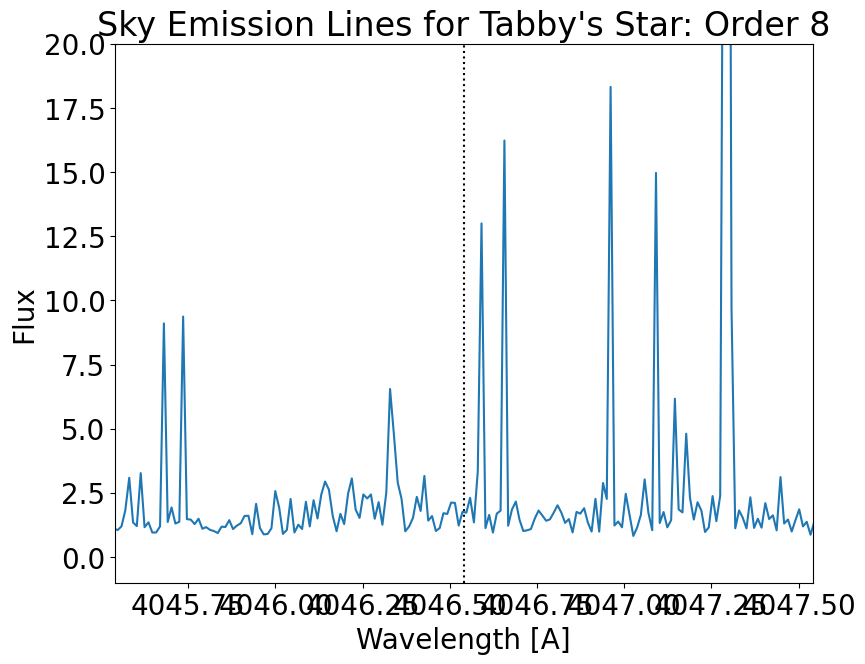

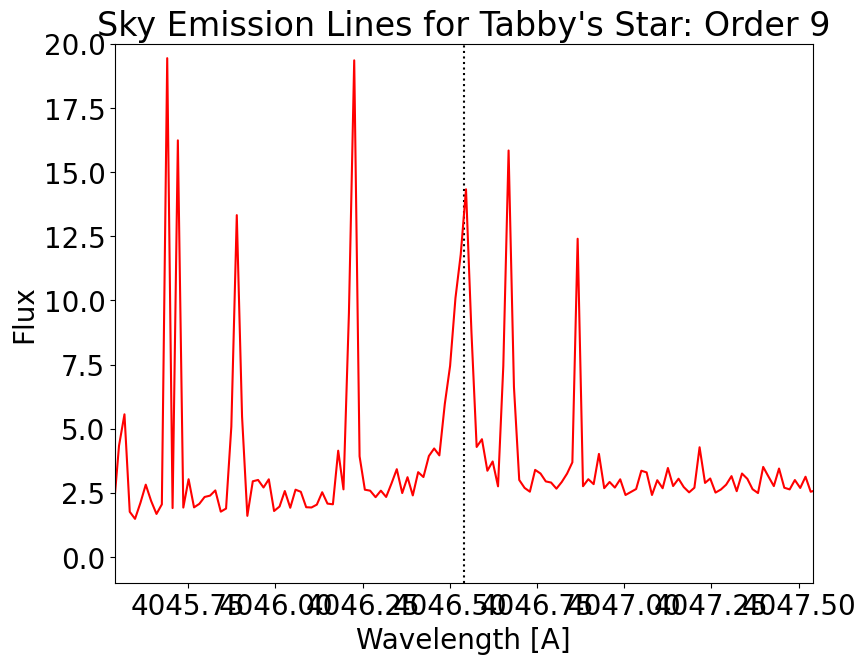

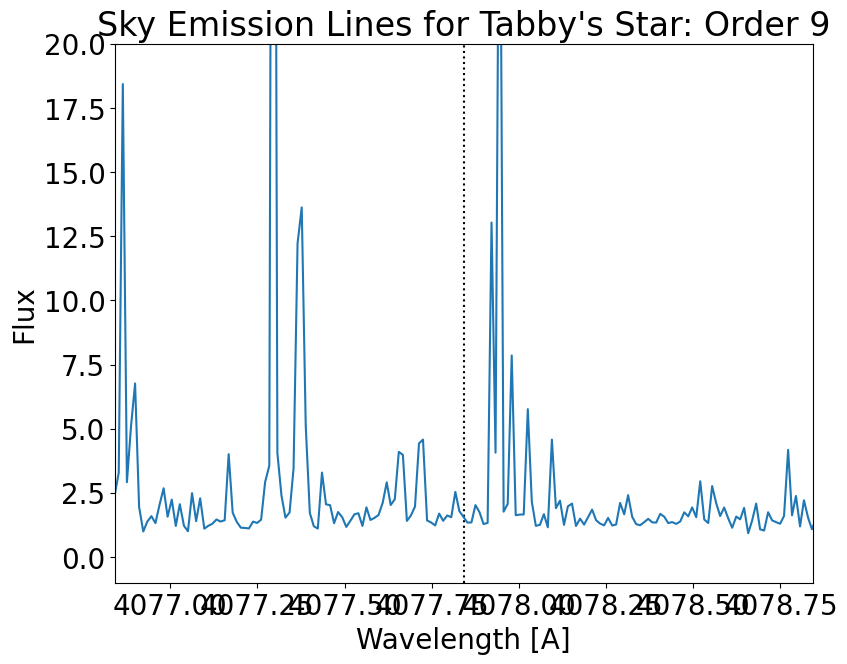

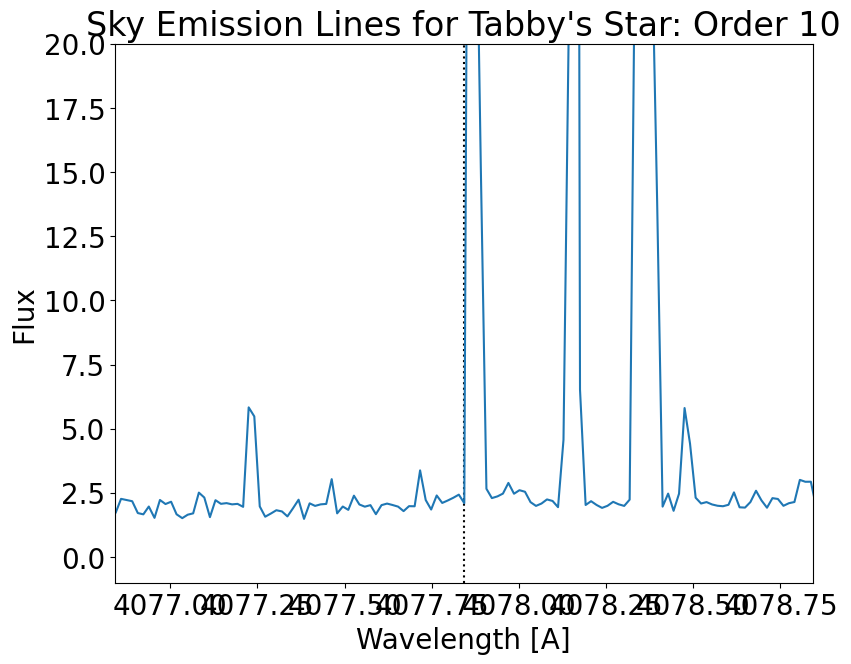

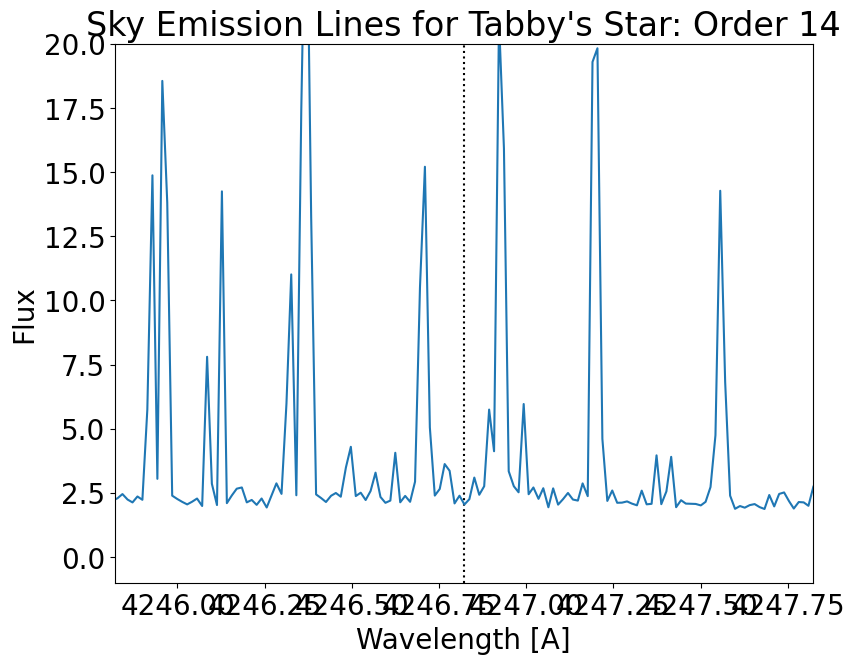

...

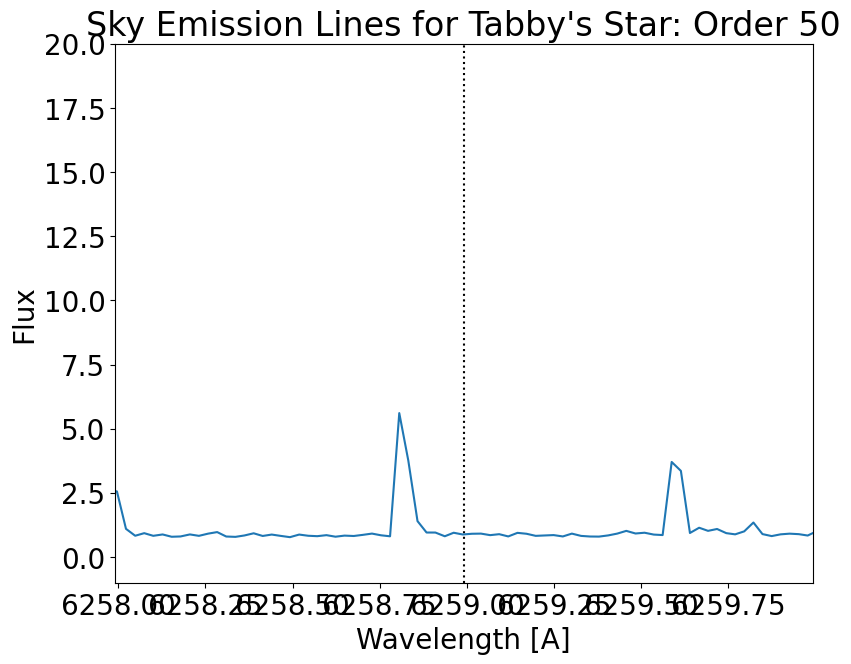

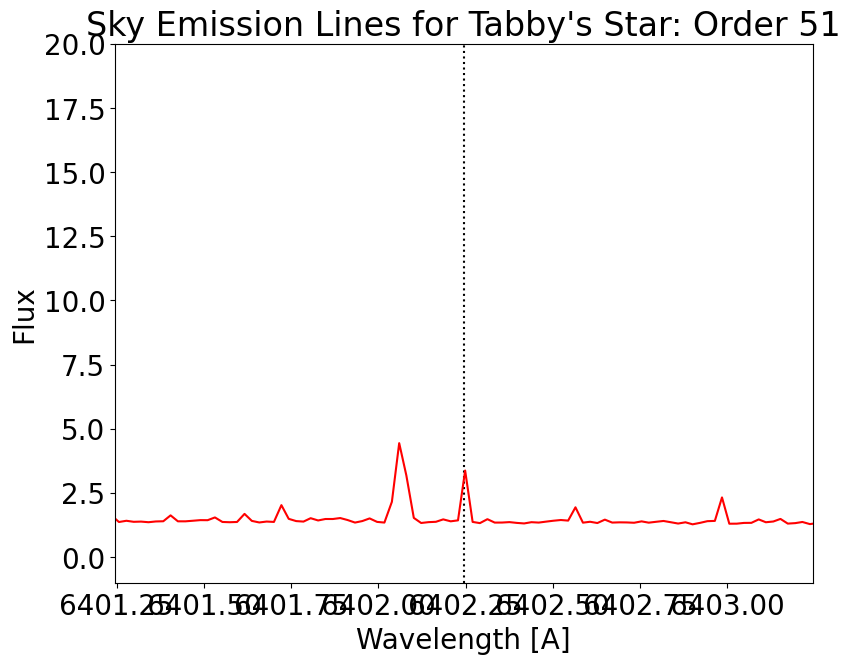

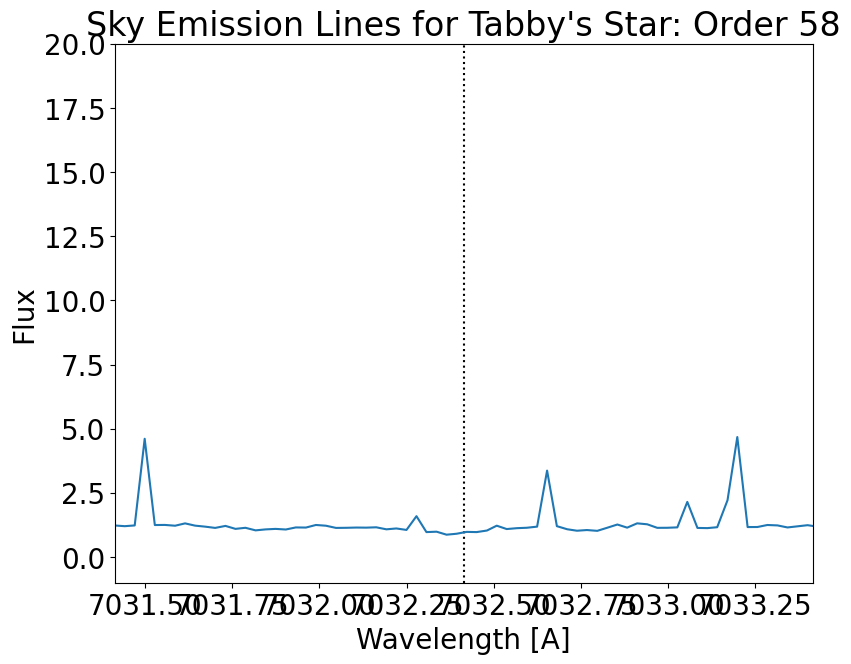

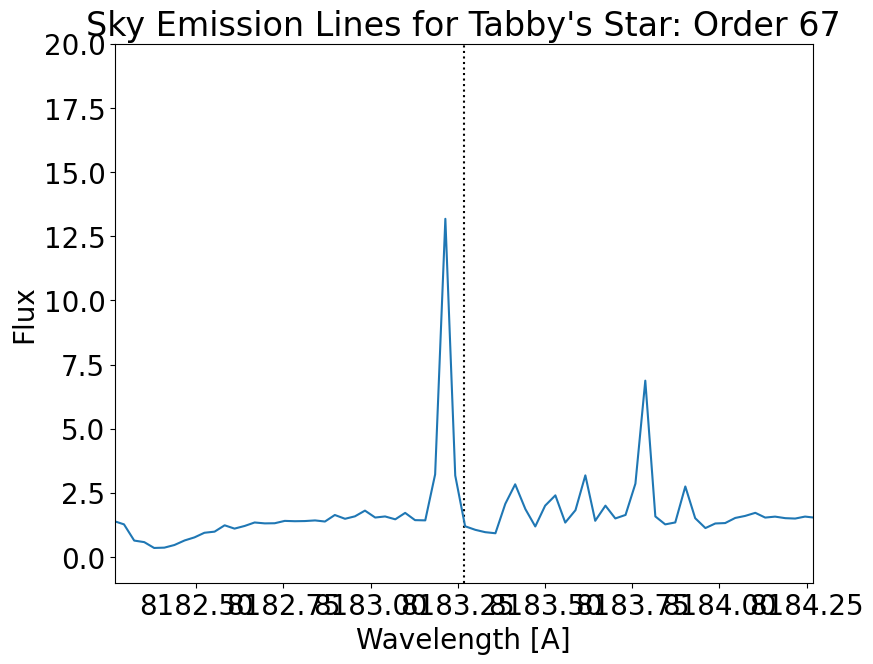

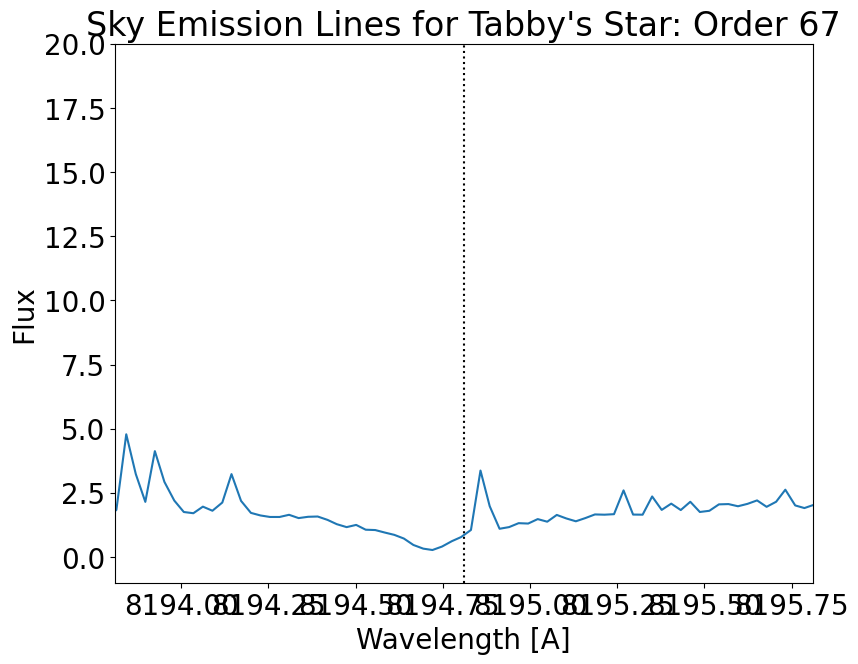

In [142]:
# take certain percentile of spectra

APF_emission_lines = []
orders_with_emission_lines = []

percentile = 99

deblaze = False

# for order in orders_with_strong_lines:
for order in orders_with_strong_lines:

    wl = wl_image[order]
    flux_vals = []

    for f in kic_fnames[1:60]:
        APF_flux_path = f
        fl_file = fits.open(APF_flux_path)
        fl_image = fl_file[0].data

        flux = fl_image[order][:-1]
        
        if deblaze == True:

            bin = 100

            # this list will contain the indices corresponding to each of the 95th percentile flux values in each bin
            indices = []

            for i in np.arange((len(wl) - (bin)), step = bin):
                flux_values = []
                for j in np.arange(i, i + bin, step = 1):
                    value = flux[j]
                    flux_values = np.append(flux_values, value)
                # find the 95th percentile flux value: we use 95 to get the maximum flux value in general 
                # but avoid issues with cosmic rays and other emission lines
                flux_in_bin = np.percentile(flux_values, 95)
                # find the closest value in the flux array to the 95th percentile value
                absolute_difference_function = lambda list_value : abs(list_value - flux_in_bin)
                flux_in_bin = min(flux_values.tolist(), key=absolute_difference_function)
                index_in_bin = flux_values.tolist().index(flux_in_bin)
                index = i + index_in_bin
                indices = np.append(indices, index)

            # these lists will contain the wavlength and flux values at each index in 'indices'
            wl_values = []
            fl_values = []

            for index in indices:
                ind = int(index)
                wl_values = np.append(wl_values, wl[ind])
                fl_values = np.append(fl_values, flux[ind])

            spl = splrep(wl_values, fl_values, s = 500000)
            flux_fit = splev(wl, spl)

            first_normalized_flux = flux / flux_fit
            
        else:
            first_normalized_flux = flux / np.median(flux)
        
        
        if np.array_equal(flux_vals,np.array([])):
            flux_vals = [first_normalized_flux]
        else:
            flux_vals += [first_normalized_flux]    
        median_flux_array = np.percentile(np.stack(flux_vals), percentile, axis = 0)

#     plt.plot(wl, median_flux_array, label='Normalized Spectra: ' + str(percentile) + ' percentile')
    
    
    boolean_array = np.logical_and(strongest_lines >= min(wl), strongest_lines <= max(wl))
    in_range_indices = np.where(boolean_array)[0]
    if in_range_indices.size != 0:
        
#         plt.vlines(strongest_lines[in_range_indices[0]], ymin= -1, ymax= max(median_flux_array) + 1, 
#                    linestyles='dotted', label='Known Emission Lines')

        for ind in in_range_indices:
            plt.vlines(strongest_lines[ind], ymin= -1, ymax= max(median_flux_array) + 1, 
                       linestyles='dotted')
            plt.xlim(strongest_lines[ind] - 1, strongest_lines[ind] + 1)
            
            absolute_difference_function = lambda list_value : abs(list_value - strongest_lines[ind])
            closest_value = min(wl, key=absolute_difference_function)
            idx = wl.tolist().index(closest_value)
            if median_flux_array[idx] > 3:
                plt.plot(wl, median_flux_array, color='red')
                APF_emission_lines += [strongest_lines[ind]]
                orders_with_emission_lines += [order]
            else:
                plt.plot(wl, median_flux_array)
            
            plt.xlabel('Wavelength [A]')
            plt.ylabel('Flux')
            plt.title("Sky Emission Lines for Tabby's Star: Order " + str(order))
#             plt.legend()
            plt.ylim(-1, 20)
#             plt.xlim(4046.54 - 0.3, 4046.54 + 0.3)
            plt.show()

# Figs for Paper

In [143]:
def plot_all(order, wavelength):
    
    plt.figure()
    plt.vlines(0, ymin=0, ymax=50, linestyle='--', linewidth = 0.5)

    intensities = []

    for f in kic_fnames[0:61]:

        APF_flux_path = f
        fl_file = fits.open(APF_flux_path)

        fl_image = fl_file[0].data
        header = fl_file[0].header

        wl = wl_image[order] - wavelength
        flux = fl_image[order][:-1] / np.median(fl_image[order][:-1])

        continuum_indicies = list(np.where(np.logical_and(wl>=-.3, wl<=-.1))) + list(np.where(np.logical_and(wl>=.1, wl<=.3)))
        continuum_indicies = ((continuum_indicies[0].tolist()+continuum_indicies[1].tolist()))
        continuum_value = np.median(flux[continuum_indicies])

        peak_indicies = np.where(np.logical_and(wl>=-.1, wl<=.1))
        peak_value = np.max(flux[peak_indicies])


        intensity = (peak_value - continuum_value) / continuum_value
        intensities += [intensity]


        plt.plot(wl, flux)

        plt.xlabel('Wavelength - 4046.54 [A]')
        plt.ylabel('Flux')

    plt.vlines(0, ymin=0, ymax=50, linestyle='--', linewidth = 0.5, label = 'Known Emission Line')
    plt.legend()
    return intensities

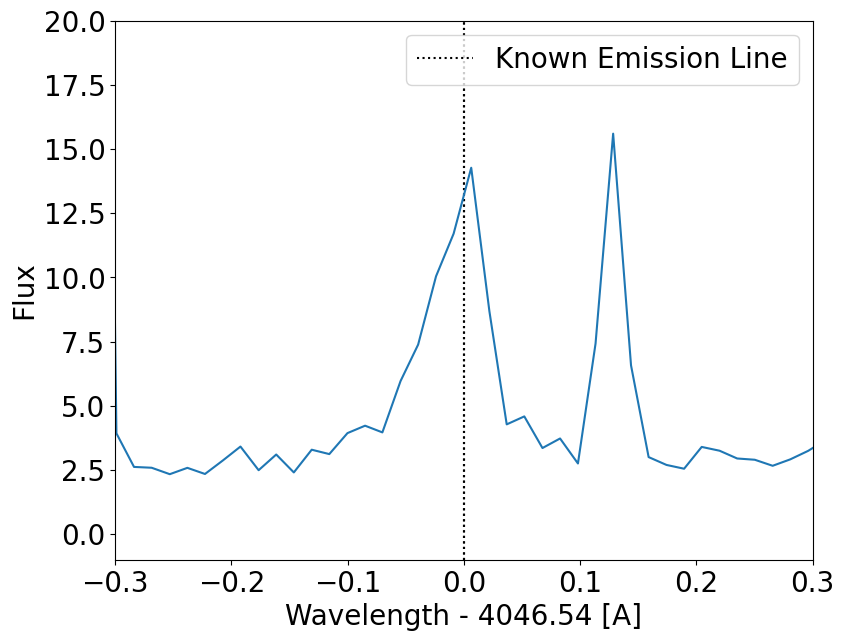

In [144]:
# take certain percentile of spectra
order = 9

wl = wl_image[order]
flux_vals = []

for f in kic_fnames[0:60]:
    APF_flux_path = f
    fl_file = fits.open(APF_flux_path)
    fl_image = fl_file[0].data

    flux = fl_image[order][:-1]
    first_normalized_flux = flux / np.median(flux)


    if np.array_equal(flux_vals,np.array([])):
        flux_vals = [first_normalized_flux]
    else:
        flux_vals += [first_normalized_flux]    
    median_flux_array = np.percentile(np.stack(flux_vals), percentile, axis = 0)

#     plt.plot(wl, median_flux_array, label='Normalized Spectra: ' + str(percentile) + ' percentile')


boolean_array = np.logical_and(strongest_lines >= min(wl), strongest_lines <= max(wl))
in_range_indices = np.where(boolean_array)[0]
if in_range_indices.size != 0:

#         plt.vlines(strongest_lines[in_range_indices[0]], ymin= -1, ymax= max(median_flux_array) + 1, 
#                    linestyles='dotted', label='Known Emission Lines')

    for ind in [in_range_indices[0]]:
        plt.vlines(strongest_lines[ind] - 4046.54, ymin= -1, ymax= max(median_flux_array) + 1, 
                   linestyles='dotted')
        plt.xlim(strongest_lines[ind] - 1, strongest_lines[ind] + 1)

        absolute_difference_function = lambda list_value : abs(list_value - strongest_lines[ind])
        closest_value = min(wl, key=absolute_difference_function)
        idx = wl.tolist().index(closest_value)
        if median_flux_array[idx] > 3:
            plt.plot(wl - 4046.54, median_flux_array)
            APF_emission_lines += [strongest_lines[ind]]
            orders_with_emission_lines += [order]
            plt.vlines(0, ymin= -1, ymax= max(median_flux_array) + 1, 
                   linestyles='dotted', label = 'Known Emission Line')

        plt.xlabel('Wavelength - 4046.54 [A]')
        plt.ylabel('Flux')
#             plt.title("Sky Emission Lines for Tabby's Star: Order " + str(order))
#             plt.legend()
        plt.ylim(-1, 20)
        plt.xlim(-0.3, 0.3)

        plt.legend()
#             plt.savefig('stackedskyemissionline.pdf')
        plt.show()

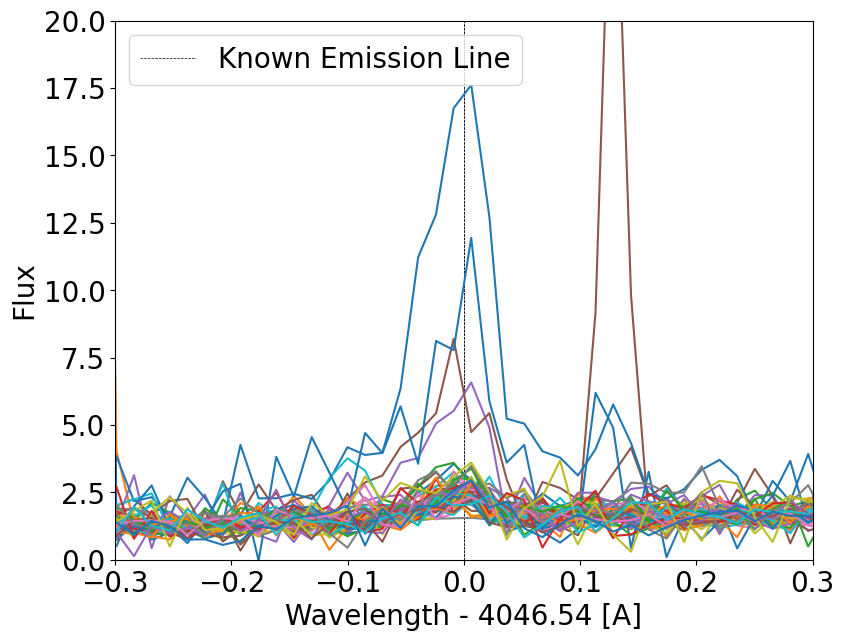

In [145]:
plt.rcParams["figure.figsize"] = (9,7)
plt.rcParams.update({'font.size': 20})

order = orders_with_emission_lines[0]
wavelength = APF_emission_lines[0]
intensities = plot_all(order, wavelength)
plt.xlim(-.3, .3)
plt.ylim(0, 20)
plt.show()

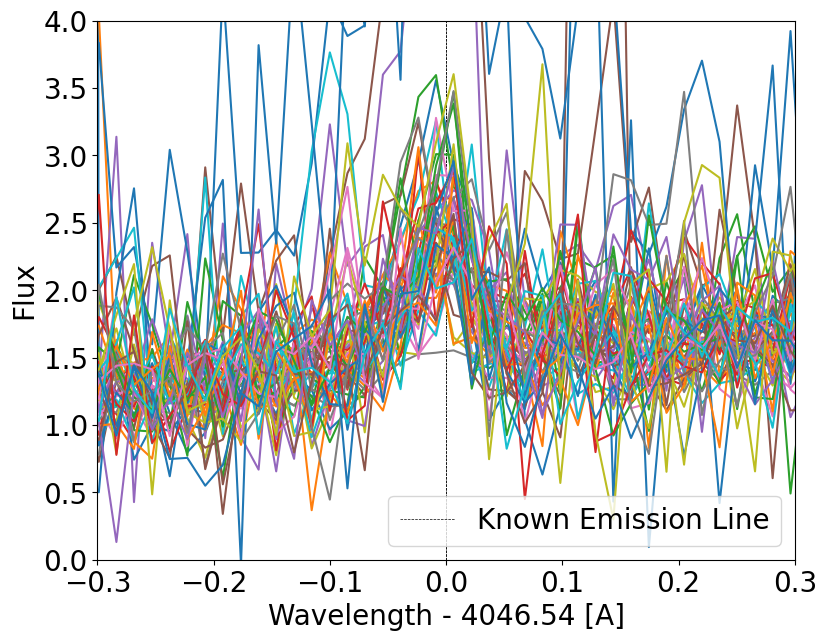

In [146]:
order = orders_with_emission_lines[0]
wavelength = APF_emission_lines[0]
intensities = plot_all(order, wavelength)
plt.xlim(-0.3,0.3)
plt.ylim(0, 4)
plt.show()
plt.show()

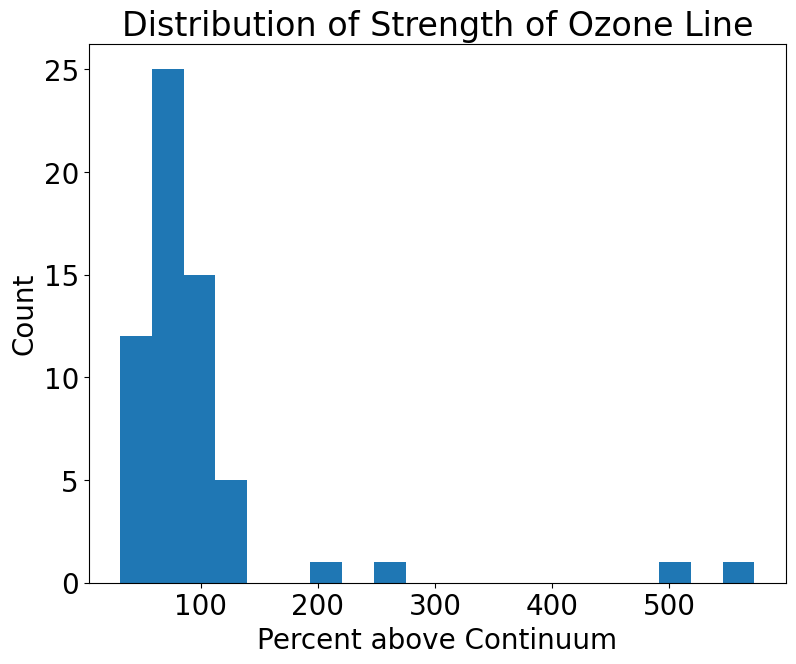

In [147]:
percent_intensities = [100 * i for i in intensities]
plt.hist(percent_intensities, bins=20)
plt.title('Distribution of Strength of Ozone Line')
plt.xlabel('Percent above Continuum')
plt.ylabel('Count')
plt.show()

# Other Lines

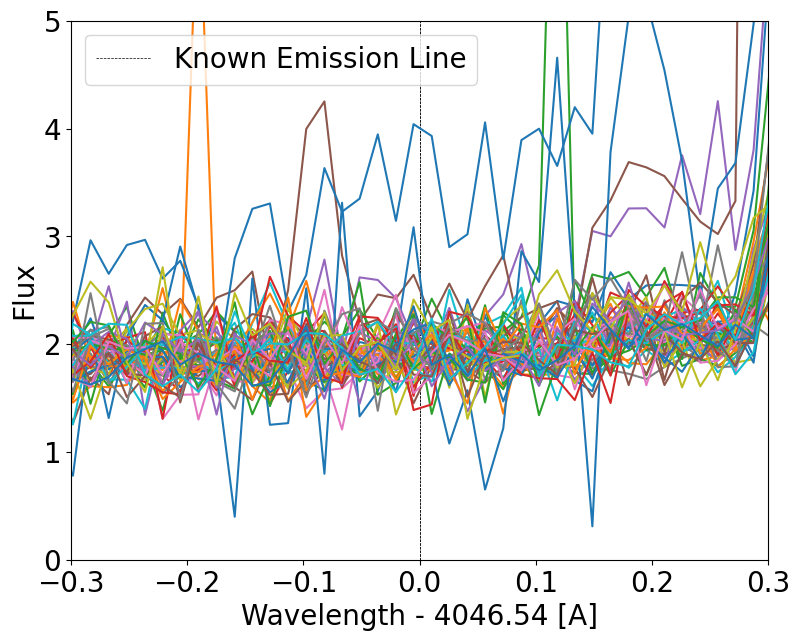

In [148]:
order = orders_with_emission_lines[1]
wavelength = APF_emission_lines[1]
plot_all(order, wavelength)
plt.xlim(-0.3, 0.3)
plt.ylim(0, 5)
plt.show()

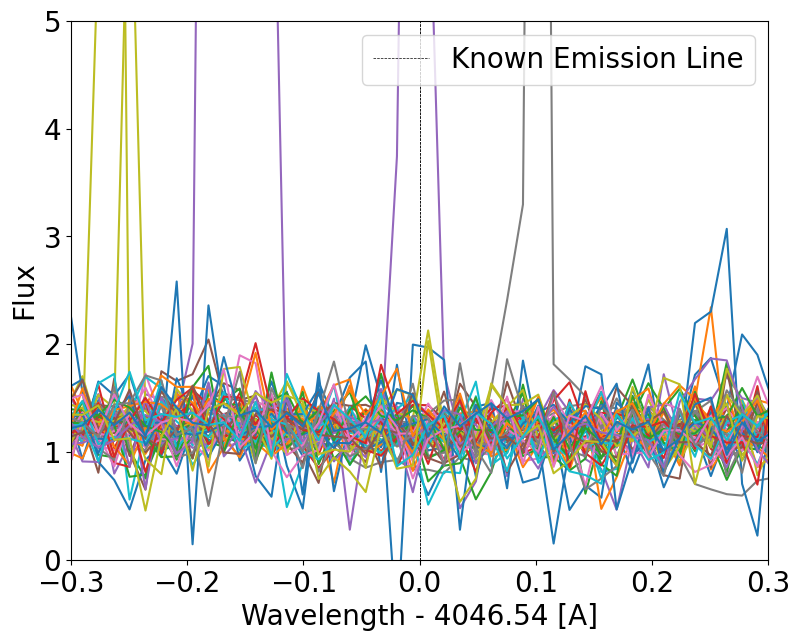

In [149]:
order = orders_with_emission_lines[2]
wavelength = APF_emission_lines[2]
plot_all(order, wavelength)
plt.xlim(-0.3, 0.3)
plt.ylim(0, 5)
plt.show()

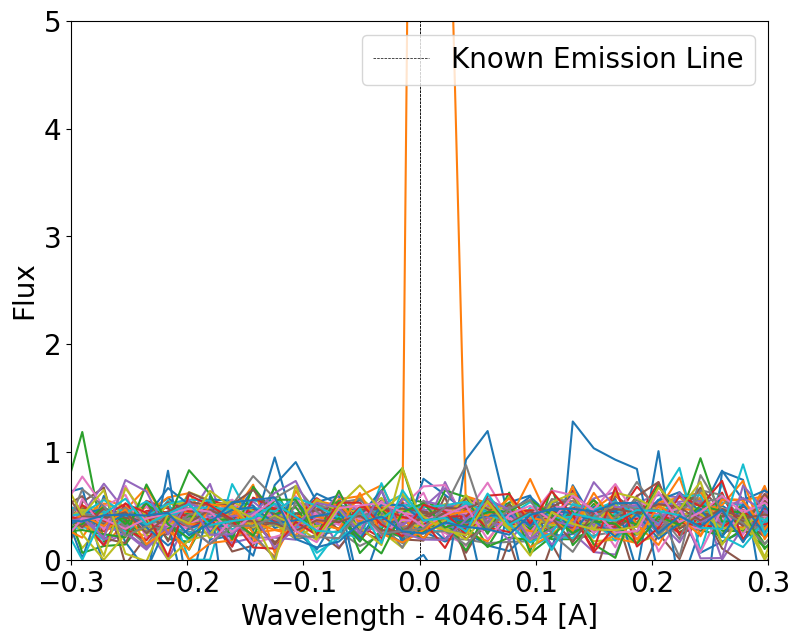

In [150]:
order = orders_with_emission_lines[3]
wavelength = APF_emission_lines[3]
plot_all(order, wavelength)
plt.xlim(-0.3, 0.3)
plt.ylim(0, 5)
plt.show()